<center> <h1>WISCONSIN BREAST CANCER EDA</h1> </center>
<img src="https://www.rxdatascience.com/hubfs/Raj%20Files/es1.jpg">

In this project we will show potential of the machine learning to enhance cancer detection accuracy while also speeding up diagnosis. On the other hand, humans rely on a small set of clearly quantifiable criteria to diagnose, machine learning may uncover deeper trends and patterns in test findings. Perhaps most crucially, machine learning has the potential to increase the percentage of patients detected early, which has been shown to treble cancer survival rates.

 Project will be done in 3 sections, these are:
* 1. Introduction & First Look
* 2. Preprocessing & Visualization
* 3. Train & Evaluation

Let's dive deep to understand how machine learning determines if the cell is malignant or benign.

## 1. Introduction & First Look
Required libraries will be imported and data will be read from **wdbc.data** file. Then, columns will be generated to name each feature and description of data will be shown.

### 1.1 Importing Libraries

In case you don't have **imblearn(SMOTE)** or **missingno** library, you can download by uncommenting pip install commands below

In [1]:
#!pip install imblearn
#!pip install missingno

In [2]:
import pandas as pd
import numpy as np
import seaborn as sns
import missingno as msno
import pickle

import matplotlib.pyplot as plt
from matplotlib import cm

import warnings
warnings.filterwarnings('ignore')

from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import f1_score, accuracy_score, recall_score, precision_score, make_scorer
from sklearn.metrics import confusion_matrix

from imblearn.over_sampling import SMOTE
from imblearn.over_sampling import RandomOverSampler

### 1.2 Importing & Describing Data

Because of headers are not given in the data set, but mentioned how are they located at **wdbc.names** we will set headers for each column. Thus, column names will be:

* 1 id
* 2 diagnosis
* 3-13 "feature_name"_mean
* 13-23 "feature_name"_se
* 23-32 "feature_name"_worst

In [3]:
with open("datasets/wdbc.names") as f:
    data_description = f.read()
    print(data_description[data_description.find("Attribute information"):data_description.find("Worst Radius.")] + "Worst Radius.")

Attribute information

1) ID number
2) Diagnosis (M = malignant, B = benign)
3-32)

Ten real-valued features are computed for each cell nucleus:

	a) radius (mean of distances from center to points on the perimeter)
	b) texture (standard deviation of gray-scale values)
	c) perimeter
	d) area
	e) smoothness (local variation in radius lengths)
	f) compactness (perimeter^2 / area - 1.0)
	g) concavity (severity of concave portions of the contour)
	h) concave points (number of concave portions of the contour)
	i) symmetry 
	j) fractal dimension ("coastline approximation" - 1)

Several of the papers listed above contain detailed descriptions of
how these features are computed. 

The mean, standard error, and "worst" or largest (mean of the three
largest values) of these features were computed for each image,
resulting in 30 features.  For instance, field 3 is Mean Radius, field
13 is Radius SE, field 23 is Worst Radius.


In [4]:
columns = ["id", "diagnosis"]
feature_names = ["radius", "texture", "perimeter", "area", "smoothness", "compactness", "concavity", "concave_points", "symmetry", "fractial_dimension"]
for i in range(30):
    if 0 <= i and i < 10:
        columns.append(feature_names[i % 10] + "_mean")
    if 10 <= i and i < 20:
        columns.append(feature_names[i % 10] + "_se")
    if 20 <= i:
        columns.append(feature_names[i % 10] + "_worst")

In [5]:
df = pd.read_csv("datasets/wdbc.data")
df.columns = columns
df.head()

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave_points_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave_points_worst,symmetry_worst,fractial_dimension_worst
0,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
1,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
2,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
3,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678
4,843786,M,12.45,15.70,82.57,477.1,0.12780,0.17000,0.1578,0.08089,...,15.47,23.75,103.40,741.6,0.1791,0.5249,0.5355,0.1741,0.3985,0.12440


In [6]:
print(f"There are total {df.shape[0]} rows and {df.shape[1]} columns at total.")

There are total 568 rows and 32 columns at total.


By describing data and checking column names it can be understood that all data is numerical but diagnosis. Diagnosis is a categorical feature.

In [7]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
id,568.0,3.042382e+07,1.251246e+08,8670.000000,869222.500000,906157.000000,8.825022e+06,9.113205e+08
radius_mean,568.0,1.412049e+01,3.523416e+00,6.981000,11.697500,13.355000,1.578000e+01,2.811000e+01
texture_mean,568.0,1.930533e+01,4.288506e+00,9.710000,16.177500,18.855000,2.180250e+01,3.928000e+01
perimeter_mean,568.0,9.191475e+01,2.428585e+01,43.790000,75.135000,86.210000,1.038750e+02,1.885000e+02
area_mean,568.0,6.542798e+02,3.519238e+02,143.500000,420.175000,548.750000,7.826250e+02,2.501000e+03
smoothness_mean,568.0,9.632148e-02,1.404601e-02,0.052630,0.086290,0.095865,1.053000e-01,1.634000e-01
compactness_mean,568.0,1.040360e-01,5.235523e-02,0.019380,0.064815,0.092525,1.304000e-01,3.454000e-01
concavity_mean,568.0,8.842731e-02,7.929422e-02,0.000000,0.029540,0.061400,1.296500e-01,4.268000e-01
concave_points_mean,568.0,4.874629e-02,3.861717e-02,0.000000,0.020310,0.033455,7.373000e-02,2.012000e-01
symmetry_mean,568.0,1.810549e-01,2.731942e-02,0.106000,0.161900,0.179200,1.956250e-01,3.040000e-01


## 2. Preprocessing & Visualization

Data will be scaled to drop computational power at traning section and outliers will be supressed to avoid machine learning algorithms to be biased because of outliers. Also, data will be visualized to understand how malignant and benign cells are differ from each other. At last, correlations will be shown both for both input input features and target feature.

### 2.1 Checking Null Data

Data is visualized with missingno library to check if there is any null values in data. In addition, to demonstrate numerically it is printed with code below graph.

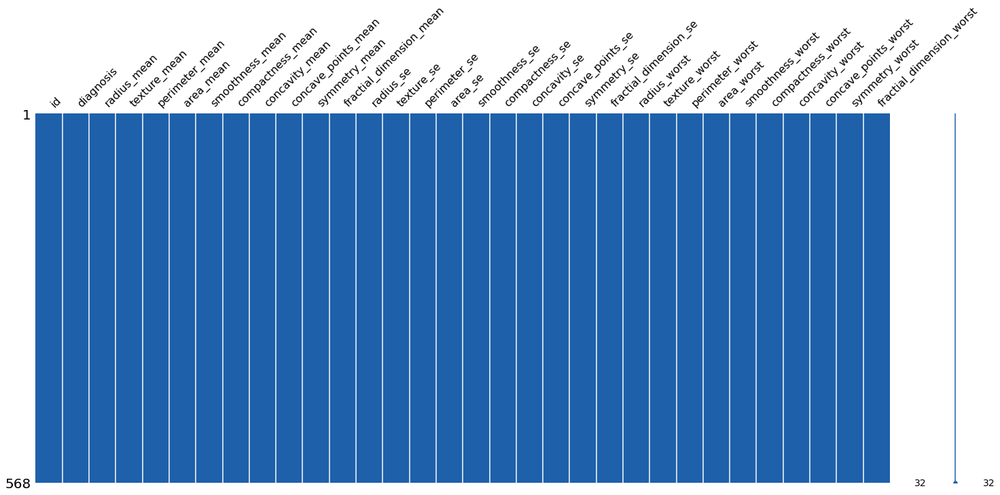

In [8]:
msno.matrix(df, color=(30/255, 96/255, 170/255));

In [9]:
print("This data has", df.isnull().sum().sum(), "Null values at total.")

This data has 0 Null values at total.


Let's show counts and percentages of output feature (diagnosis). By comparing their counts it is a little imbalanced data set. We can use under-sampling or over-sampling to eliminate this problem. Because of under-sampling causes lot of information loss over-sampling will be used.

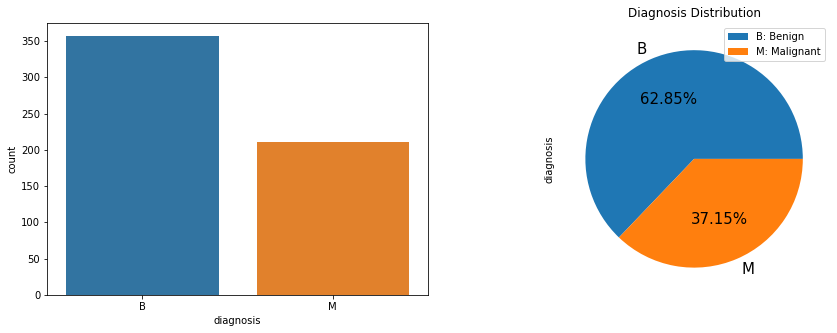

In [10]:
fig, axes = plt.subplots(1, 2, figsize=(5, 10))
sns.countplot(x="diagnosis", data=df, order=["B", "M"], ax=axes[0])
df.diagnosis.value_counts().plot(kind="pie", figsize=(15,5), 
                                 title="Diagnosis Distribution", autopct="%1.2f%%", fontsize=15, ax=axes[1])
axes[1].legend(["B: Benign", "M: Malignant"]);

### 2.2 Checking Duplicates
With the purpose of checking if there is null data by comparing all rows and same id's.

In [11]:
df[df.duplicated()]

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave_points_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave_points_worst,symmetry_worst,fractial_dimension_worst


In [12]:
print(f"Since there are still {df.drop_duplicates(subset='id').shape[0]} rows after dropping duplicates, it means data set does not have duplicate data.")

Since there are still 568 rows after dropping duplicates, it means data set does not have duplicate data.


### 2.3 Scaling & Supressing

To decrease computational power features will be scaled by the **standard scaler**. With this, we still keep **same distances between data and decrease the consumed time** to train machine learning model. Additionally, id column will be dropped since it is not required to estimate category of the output. Also, considering to process new observed datas scalers are saved in dictionary and that dictionary will be saved into general dictionary called as **parameters_dict.**

In [13]:
# General dictionary to conserve interquartile range boundaries and scalers
parameters_dict = {}
df.drop("id",axis=1, inplace=True)

In [14]:
# Scaler dictionary to conserve scalers
scaler_dict = {}
for col in df.drop("diagnosis", axis=1).columns:
    scaler_dict[col] = StandardScaler()
    df[col] = scaler_dict[col].fit_transform(df[[col]])

In [15]:
# Column list for mean encoded columns
mean_cols = []
# Column list for standard error encoded columns
se_cols = []
# Column list for worst encoded columns
worst_cols = []
for col in df.columns:
    if "_mean" in col:
        mean_cols.append(str(col))
    elif "_se" in col:
        se_cols.append(str(col))
    elif "_worst" in col:
        worst_cols.append(str(col))

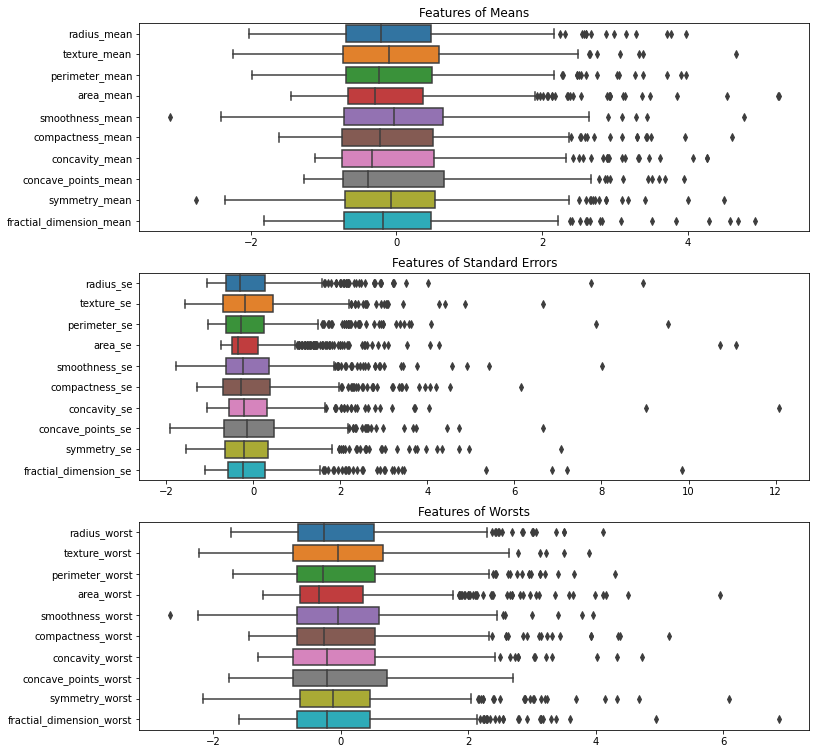

In [16]:
fig, axes = plt.subplots(3, 1, figsize=(12, 13))
sns.boxplot(data=df[mean_cols], orient="h", ax=axes[0]);
axes[0].set_title("Features of Means")

sns.boxplot(data=df[se_cols], orient="h", ax=axes[1]);
axes[1].set_title("Features of Standard Errors")

sns.boxplot(data=df[worst_cols], orient="h", ax=axes[2]);
axes[2].set_title("Features of Worsts");

Seems every feature has outliers, so outliers will be suppressed with interquartile ranges.

In [17]:
parameters_dict["boundaries"] = {}
for col in df.drop("diagnosis", axis=1).columns:
    # 25% quartile 
    Q1 = df[col].quantile(0.25)
    
    # 75% quartile
    Q3 = df[col].quantile(0.75)
    IQR = Q3 - Q1
    
    # Set boundaries
    upper_bound = Q3 + 1.5*IQR
    lower_bound = Q1 - 1.5*IQR
    parameters_dict["boundaries"][col+"_upper"] = upper_bound
    parameters_dict["boundaries"][col+"_lower"] = lower_bound
    
    # Apply to every data
    df[col] = df[col].apply(lambda x: upper_bound if x > upper_bound else x) 
    df[col] = df[col].apply(lambda x: lower_bound if x < lower_bound else x)

With the aim of double check if outliers supressed or not, they are visualized with boxplot again.

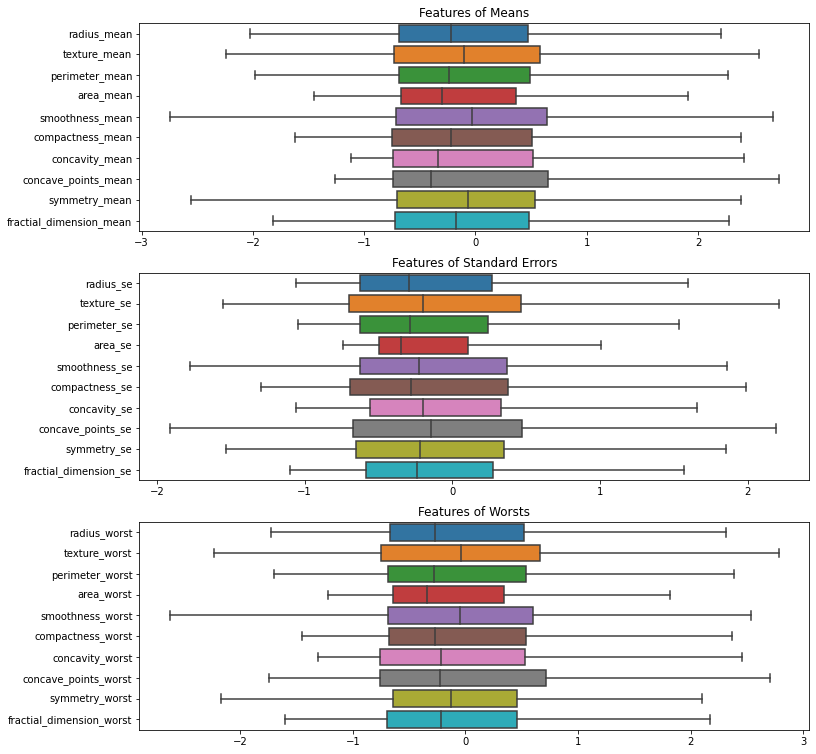

In [18]:
fig, axes = plt.subplots(3, 1, figsize=(12, 13))
sns.boxplot(data=df[mean_cols], orient="h", ax=axes[0]);
axes[0].set_title("Features of Means")

sns.boxplot(data=df[se_cols], orient="h", ax=axes[1]);
axes[1].set_title("Features of Standard Errors")

sns.boxplot(data=df[worst_cols], orient="h", ax=axes[2]);
axes[2].set_title("Features of Worsts");

### 2.4 Pairplots
Now, to visualize data from different perspectives each main category (main, standard error, worst) will be shown considering diagnosis feature. Purple represents malignant cells and orange for benign cells.

### 2.4.1 Features Encoded as Mean

<Figure size 1080x1440 with 0 Axes>

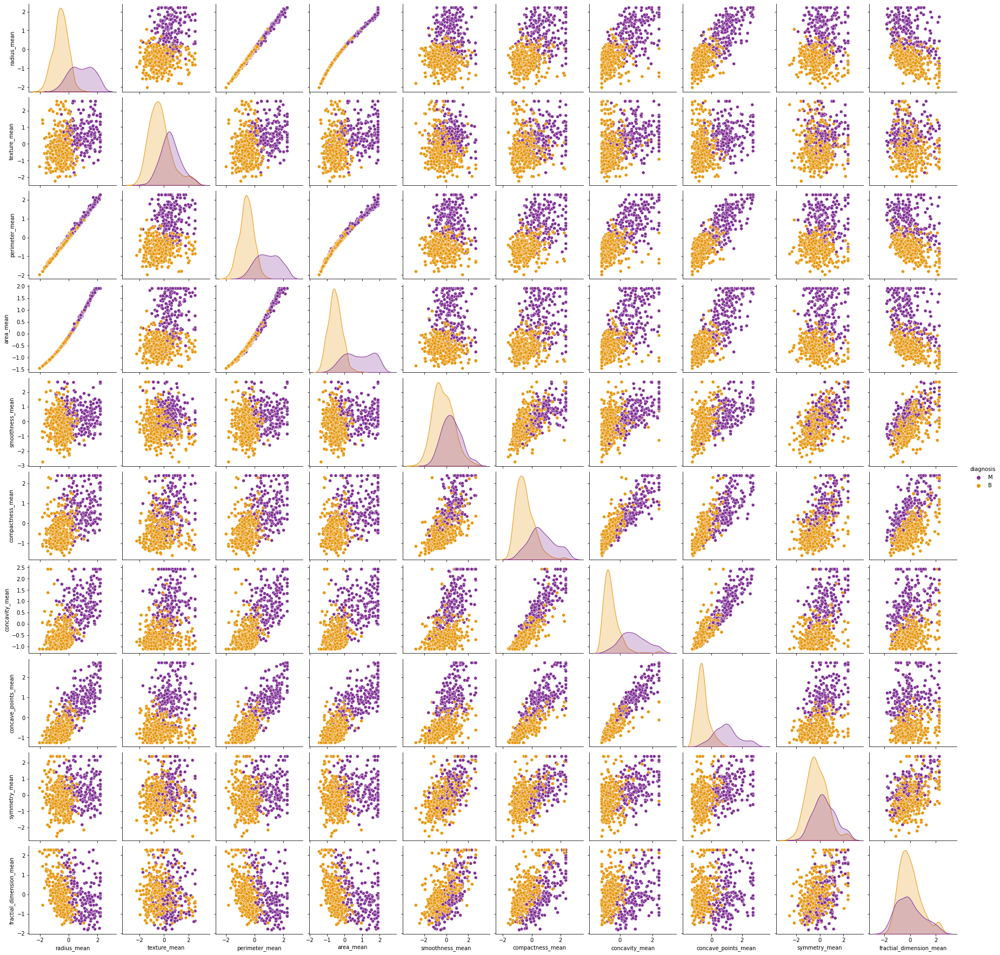

In [19]:
plt.figure(figsize=(15,20))
sns.pairplot(data=df[[*mean_cols, "diagnosis"]], hue="diagnosis", palette="CMRmap");

### 2.4.2 Features Encoded as Standard Error

<Figure size 1080x1440 with 0 Axes>

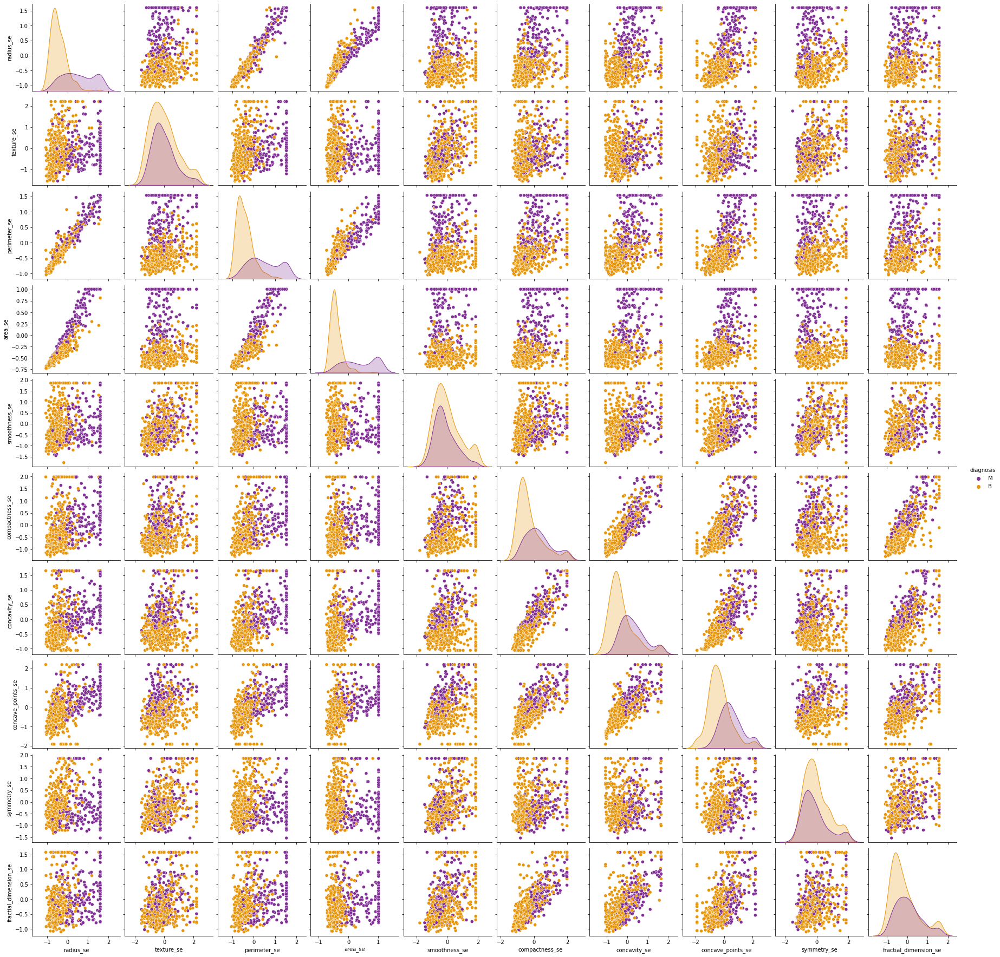

In [20]:
plt.figure(figsize=(15,20))
sns.pairplot(data=df[[*se_cols, "diagnosis"]], hue="diagnosis", palette="CMRmap");

### 2.4.3 Features Encoded as Worst

<Figure size 1080x1440 with 0 Axes>

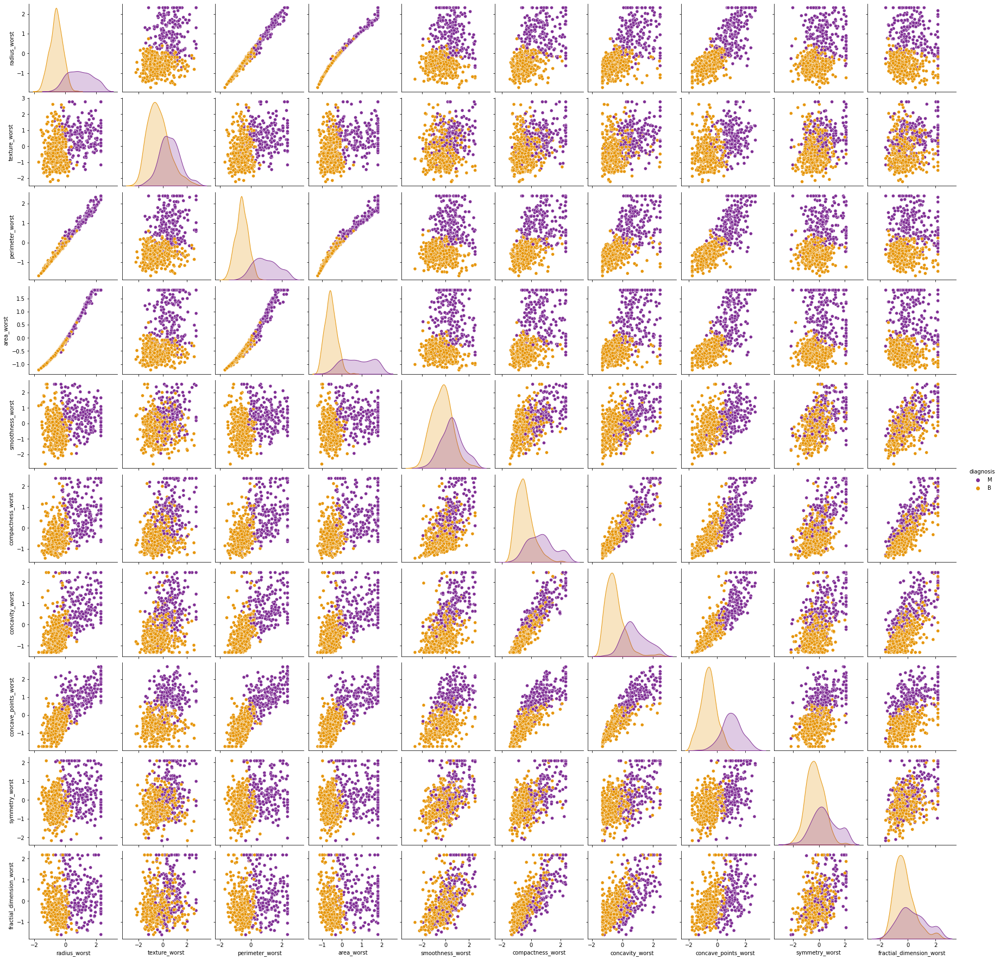

In [21]:
plt.figure(figsize=(15,20))
sns.pairplot(data=df[[*worst_cols, "diagnosis"]], hue="diagnosis", palette="CMRmap");

Almost all features looks like distiguish from each other at significant rate. This shows us to machine learning models will be generally successfull at predicting cancer cells. It can be seen from the figures that benign data distribution generally concatrates on lesser values then malignant ones.

### 2.5 Correlations & Heatmap

Correlations between features are visualized with heatmap. Some feature correlations between features are 1.0 or so close to 1.0. It means, these feature can be represented by each other, so we can remove one of these each highly correlated features to reduce dimensionalty curse.

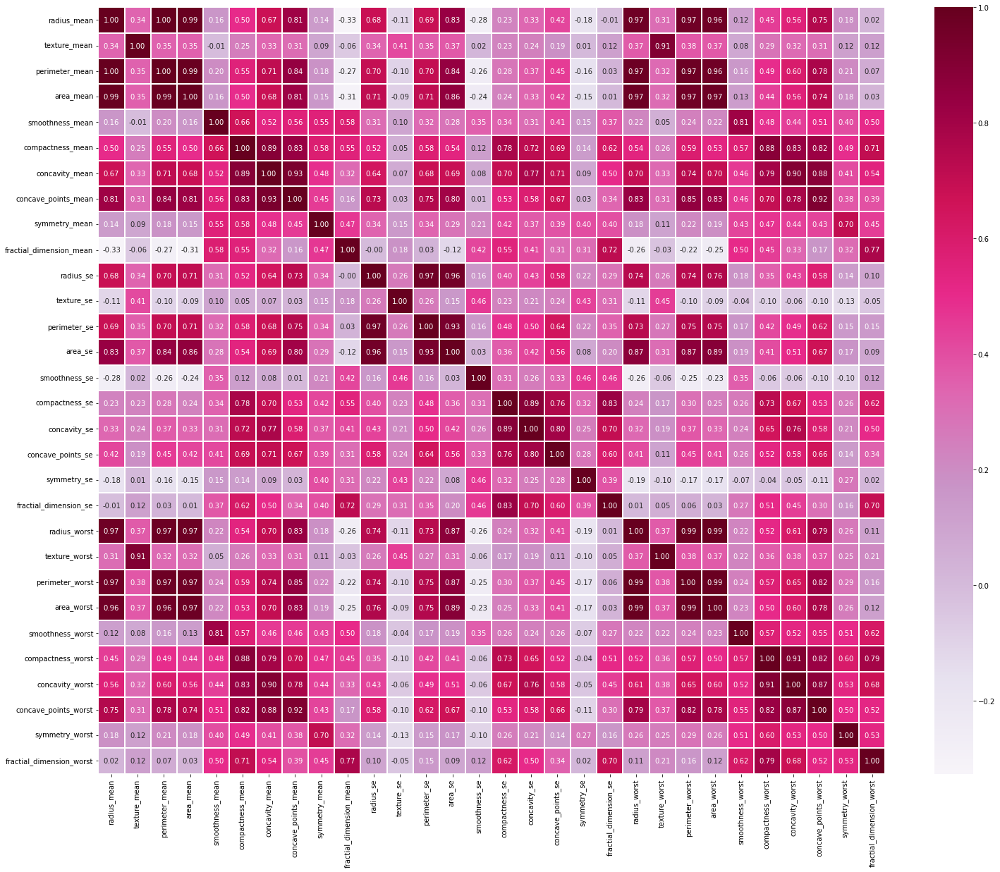

In [22]:
plt.figure(figsize=(25,20))
sns.heatmap(df.drop(["diagnosis"], axis=1).corr(), linewidths=2, cmap="PuRd", annot=True, fmt=".2f");

To visualize each feature correlation to diagnosis feature which is our output, their correlation are visualized with barplot.

In [23]:
cancer_dict = {"B":0, "M":1}
df.diagnosis = df.diagnosis.map(cancer_dict)

In [25]:
cancer_correlation_list = list()
for col in df.drop("diagnosis", axis=1).columns:
    cancer_correlation_list.append([col, round(df['diagnosis'].corr(df[col]), 3)])

cancer_correlation_list = np.array(sorted(cancer_correlation_list, key=lambda x: x[1]))

color_map = cm.get_cmap('PuRd', len(cancer_correlation_list))
color_list = [color_map(i) for i in range(len(cancer_correlation_list))]

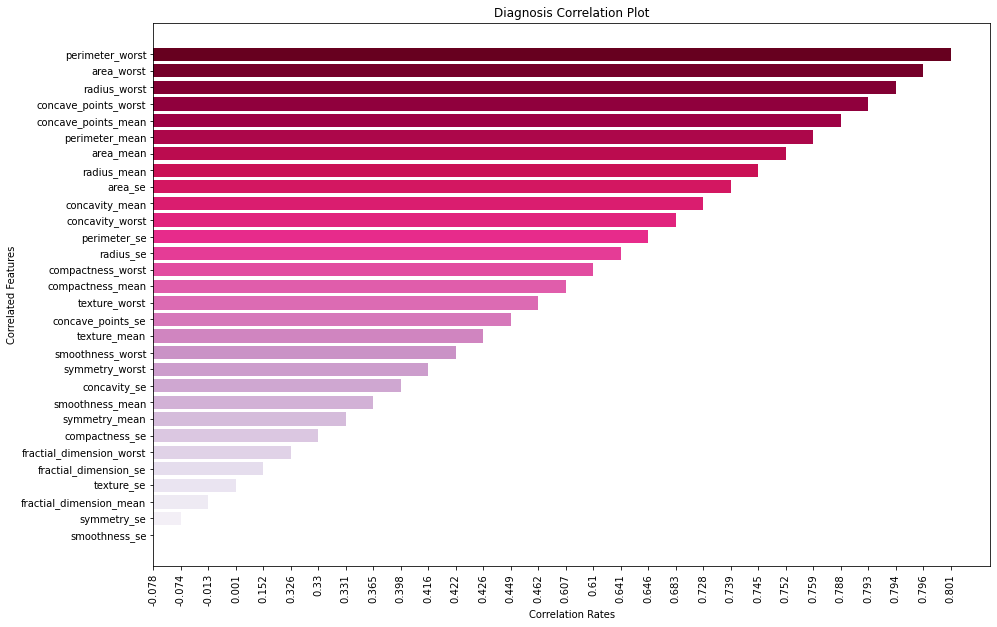

In [26]:
plt.figure(figsize=(15, 10))
plt.barh(list(cancer_correlation_list[:, 0]), cancer_correlation_list[:, 1], color=color_list)
plt.xticks(rotation=90)
plt.title("Diagnosis Correlation Plot")
plt.ylabel("Correlated Features")
plt.xlabel("Correlation Rates");

### 2.6 Oversampling

Even data is not over imbalanced, it will tend to predict more benign data if we dont equalize their data occurance. The reason of it, is because of machine learning model will update its weights with respect to benign cells more than malignant ones.

In [27]:
ros = RandomOverSampler(random_state=0)
x, y = ros.fit_resample(df.drop("diagnosis", axis=1).to_numpy(), df["diagnosis"].to_numpy())

In [28]:
np_over = np.concatenate((x,y.reshape(-1,1)), axis=1)
df_over = pd.DataFrame(np_over)
df_over.columns = [*df.drop("diagnosis", axis=1), "diagnosis"]
df_over

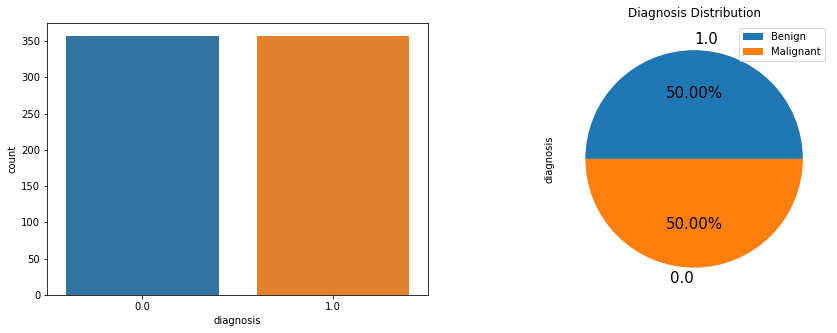

In [30]:

fig, axes = plt.subplots(1, 2, figsize=(5, 10))
sns.countplot(x="diagnosis", data=df_over, ax=axes[0])

df_over.diagnosis.value_counts().plot(kind="pie", figsize=(15,5), 
                                 title="Diagnosis Distribution", autopct="%1.2f%%", fontsize=15, ax=axes[1]);
axes[1].legend(["Benign","Malignant"]);

### 2.7 Saving Outputs

With the purpose of using the data without processing again and again it will be saved. Moreover, parameters will be saved for further data.

In [31]:
df_over.to_csv("outputs/data.csv", index=False)
pickle.dump(parameters_dict, open("outputs/parameters.pkl", "wb"))

## 3. Train & Evaluation

In this section 5 machine learning models will be trained at total, which are:
* SVM - Support Vector Machine
* Logistic Regression
* Random Forest
* Decision Tree
* KNN

After training each model their scores from different metrics will be shown to visualize their performances. Also, indices that model failed at prediction will be printed to understand reason of why machine learning model fails to predict that data. Then, their scores will be compared. After comparison, best model will be selected and commented, to understand reason of why it was better than others.

In [32]:
df_over = pd.read_csv("outputs/data.csv")
x, y = df_over.drop("diagnosis", axis=1), df_over[["diagnosis"]]

x_train, x_test, y_train, y_test = train_test_split(df_over.drop("diagnosis", axis=1),
                                                    df_over[["diagnosis"]], test_size=0.2, random_state=1506)

color_map = cm.get_cmap('RdBu', 4)
color_list = [color_map(i) for i in range(4)]

### 3.1 SVM - Support Vector Machine

SVM takes all the data and generates a line that is called **hyperplane** which divides data. This line is known as **decision boundary**. For simple SVM, each side of the hyperplane represents a category.

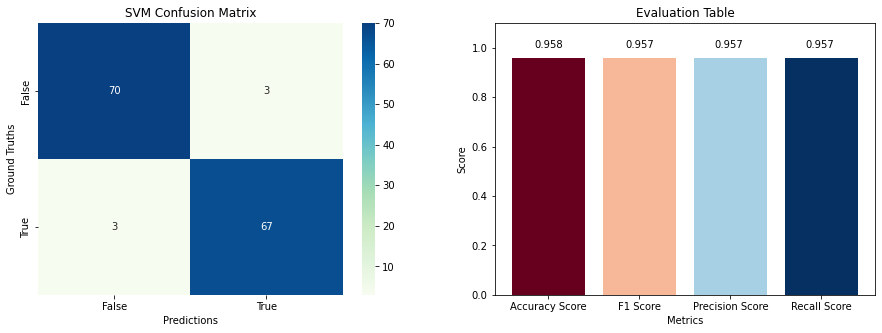

In [33]:
svm_model = SVC().fit(x_train, y_train)
y_prediction = svm_model.predict(x_test)

# Accuracy Score
model_accuracy_score = round(accuracy_score(y_test, y_prediction),3)

# F1 Score
model_f1_score = round(f1_score(y_test, y_prediction),3)

# Precision Score
model_precision_score = round(precision_score(y_test, y_prediction),3)

# Recall Score
model_recall_score = round(recall_score(y_test, y_prediction),3)

fig, axes = plt.subplots(1, 2, figsize=(15, 5))

# Confusion Matrix
ax = sns.heatmap(confusion_matrix(y_test, y_prediction), annot=True, cmap="GnBu", ax=axes[0])
ax.set_title("SVM Confusion Matrix")
ax.set_xlabel("Predictions")
ax.set_ylabel("Ground Truths")
ax.xaxis.set_ticklabels(['False','True'])
ax.yaxis.set_ticklabels(['False','True']);

# Score Plot
scores = {"Accuracy Score":model_accuracy_score,"F1 Score": model_f1_score,
                         "Precision Score": model_precision_score,"Recall Score":model_recall_score}
axes[1].bar(scores.keys(), scores.values(), color=color_list)
axes[1].annotate(model_accuracy_score, (-0.15, 1))
axes[1].annotate(model_f1_score, (0.85, 1))
axes[1].annotate(model_precision_score, (1.82, 1))
axes[1].annotate(model_recall_score, (2.82, 1))
axes[1].set_title("Evaluation Table")
axes[1].set_ylim([0, 1.1])
axes[1].set_xlabel("Metrics")
axes[1].set_ylabel("Score");

In [34]:
np_test = np.concatenate([x_test.to_numpy(),y_test.to_numpy().reshape(-1, 1), y_prediction.reshape(-1, 1)], axis=1)
df_test = pd.DataFrame(np_test)
df_test.columns = [*df.drop("diagnosis", axis=1), "diagnosis", "prediction"]
df_test[df_test.prediction != df_test.diagnosis]

,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave_points_mean,symmetry_mean,fractial_dimension_mean,...,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave_points_worst,symmetry_worst,fractial_dimension_worst,diagnosis,prediction
55,0.238476,-0.047922,0.210812,0.093911,-0.456152,-0.110993,-0.366394,-0.014418,0.250778,-0.604609,...,0.059050,-0.121229,-0.044568,0.316265,-0.437979,0.528214,0.104530,0.046425,0.0,1.0
67,-0.670534,-0.271974,-0.697100,-0.634730,0.239319,-0.858281,-0.777252,-0.352389,-0.701765,0.014285,...,-0.658541,-0.572805,-0.816565,-1.111363,-1.011592,-0.653263,-1.496667,-0.818502,1.0,0.0
113,-0.383628,0.738592,-0.420152,-0.420859,-0.411260,-0.887531,-0.521523,-0.562585,-0.826328,-0.301564,...,-0.451038,-0.396546,0.420384,-0.647381,-0.258484,-0.321440,-0.111892,-0.178556,1.0,0.0
118,0.099283,1.326727,0.160533,0.006030,-0.566601,0.362538,0.157435,-0.255197,0.225132,0.091113,...,0.190609,-0.122815,0.073863,1.065696,0.638028,0.094140,0.470657,1.023010,0.0,1.0
125,-0.193304,0.530877,-0.236344,-0.259602,-1.047589,-0.835914,-0.723607,-0.737013,-0.097267,-0.981636,...,-0.138287,-0.159830,-1.005178,-0.314869,-0.302756,-0.048004,0.156601,-0.690180,1.0,0.0
138,-0.221711,-0.804096,-0.223568,-0.381896,0.817929,0.945610,0.359393,0.547485,0.481586,0.889273,...,-0.312901,-0.464758,0.933586,1.442329,1.031665,0.862941,1.023916,0.984124,0.0,1.0


### 3.2 Logistic Regression
Logistic Regression is pretty similiar to Linear Regression however it is used to solve classification problems with **sigmoid function.**

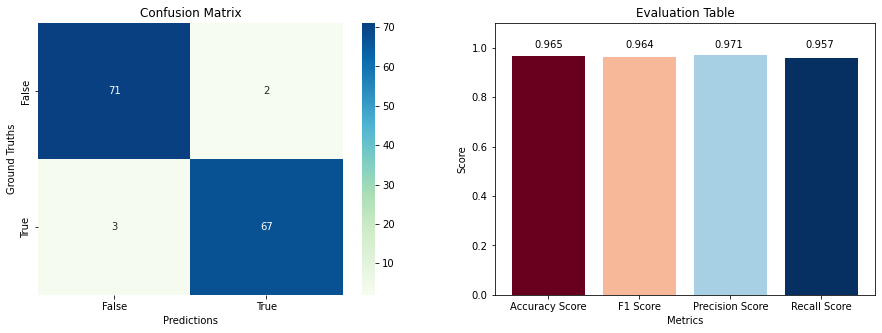

In [35]:
lg_model = LogisticRegression().fit(x_train, y_train)
y_prediction = lg_model.predict(x_test)

# Accuracy Score
model_accuracy_score = round(accuracy_score(y_test, y_prediction),3)

# F1 Score
model_f1_score = round(f1_score(y_test, y_prediction),3)

# Precision Score
model_precision_score = round(precision_score(y_test, y_prediction),3)

# Recall Score
model_recall_score = round(recall_score(y_test, y_prediction),3)

fig, axes = plt.subplots(1, 2, figsize=(15, 5))

# Confusion Matrix
ax = sns.heatmap(confusion_matrix(y_test, y_prediction), annot=True, cmap="GnBu", ax=axes[0])
ax.set_title("Confusion Matrix")
ax.set_xlabel("Predictions")
ax.set_ylabel("Ground Truths")
ax.xaxis.set_ticklabels(['False','True'])
ax.yaxis.set_ticklabels(['False','True']);

# Score Plot
scores = {"Accuracy Score":model_accuracy_score,"F1 Score": model_f1_score,
                         "Precision Score": model_precision_score,"Recall Score":model_recall_score}
axes[1].bar(scores.keys(), scores.values(), color=color_list)
axes[1].annotate(model_accuracy_score, (-0.15, 1))
axes[1].annotate(model_f1_score, (0.85, 1))
axes[1].annotate(model_precision_score, (1.82, 1))
axes[1].annotate(model_recall_score, (2.82, 1))
axes[1].set_title("Evaluation Table")
axes[1].set_ylim([0, 1.1])
axes[1].set_xlabel("Metrics")
axes[1].set_ylabel("Score");


In [36]:
np_test = np.concatenate([x_test.to_numpy(),y_test.to_numpy().reshape(-1, 1), y_prediction.reshape(-1, 1)], axis=1)
df_test = pd.DataFrame(np_test)
df_test.columns = [*df.drop("diagnosis", axis=1), "diagnosis", "prediction"]
df_test[df_test.prediction != df_test.diagnosis]

,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave_points_mean,symmetry_mean,fractial_dimension_mean,...,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave_points_worst,symmetry_worst,fractial_dimension_worst,diagnosis,prediction
55,0.238476,-0.047922,0.210812,0.093911,-0.456152,-0.110993,-0.366394,-0.014418,0.250778,-0.604609,...,0.059050,-0.121229,-0.044568,0.316265,-0.437979,0.528214,0.104530,0.046425,0.0,1.0
67,-0.670534,-0.271974,-0.697100,-0.634730,0.239319,-0.858281,-0.777252,-0.352389,-0.701765,0.014285,...,-0.658541,-0.572805,-0.816565,-1.111363,-1.011592,-0.653263,-1.496667,-0.818502,1.0,0.0
113,-0.383628,0.738592,-0.420152,-0.420859,-0.411260,-0.887531,-0.521523,-0.562585,-0.826328,-0.301564,...,-0.451038,-0.396546,0.420384,-0.647381,-0.258484,-0.321440,-0.111892,-0.178556,1.0,0.0
118,0.099283,1.326727,0.160533,0.006030,-0.566601,0.362538,0.157435,-0.255197,0.225132,0.091113,...,0.190609,-0.122815,0.073863,1.065696,0.638028,0.094140,0.470657,1.023010,0.0,1.0
125,-0.193304,0.530877,-0.236344,-0.259602,-1.047589,-0.835914,-0.723607,-0.737013,-0.097267,-0.981636,...,-0.138287,-0.159830,-1.005178,-0.314869,-0.302756,-0.048004,0.156601,-0.690180,1.0,0.0


### 3.3 Random Forest

Random Forest builds an **ensemble of decision trees**. It does it with **bagging method** which uses different subsets of training data. 

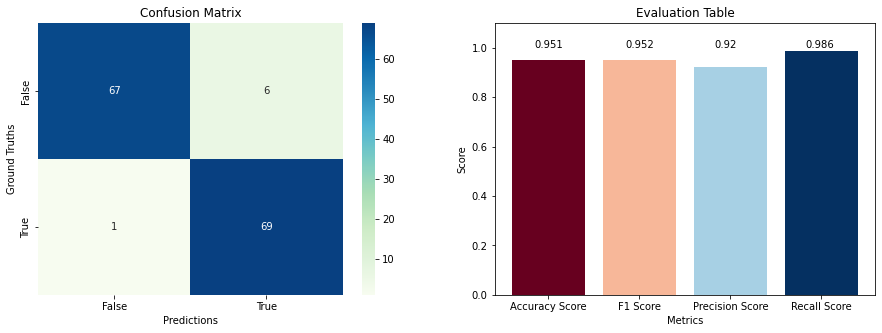

In [37]:
rf_model = RandomForestClassifier().fit(x_train, y_train)
y_prediction = rf_model.predict(x_test)

# Accuracy Score
model_accuracy_score = round(accuracy_score(y_test, y_prediction),3)

# F1 Score
model_f1_score = round(f1_score(y_test, y_prediction),3)

# Precision Score
model_precision_score = round(precision_score(y_test, y_prediction),3)

# Recall Score
model_recall_score = round(recall_score(y_test, y_prediction),3)

fig, axes = plt.subplots(1, 2, figsize=(15, 5))

# Confusion Matrix
ax = sns.heatmap(confusion_matrix(y_test, y_prediction), annot=True, cmap="GnBu", ax=axes[0])
ax.set_title("Confusion Matrix")
ax.set_xlabel("Predictions")
ax.set_ylabel("Ground Truths")
ax.xaxis.set_ticklabels(['False','True'])
ax.yaxis.set_ticklabels(['False','True']);

# Score Plot
scores = {"Accuracy Score":model_accuracy_score,"F1 Score": model_f1_score,
                         "Precision Score": model_precision_score,"Recall Score":model_recall_score}
axes[1].bar(scores.keys(), scores.values(), color=color_list)
axes[1].annotate(model_accuracy_score, (-0.15, 1))
axes[1].annotate(model_f1_score, (0.85, 1))
axes[1].annotate(model_precision_score, (1.82, 1))
axes[1].annotate(model_recall_score, (2.82, 1))
axes[1].set_title("Evaluation Table")
axes[1].set_ylim([0, 1.1])
axes[1].set_xlabel("Metrics")
axes[1].set_ylabel("Score");

In [38]:
np_test = np.concatenate([x_test.to_numpy(),y_test.to_numpy().reshape(-1, 1), y_prediction.reshape(-1, 1)], axis=1)
df_test = pd.DataFrame(np_test)
df_test.columns = [*df.drop("diagnosis", axis=1), "diagnosis", "prediction"]
df_test[df_test.prediction != df_test.diagnosis]

,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave_points_mean,symmetry_mean,fractial_dimension_mean,...,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave_points_worst,symmetry_worst,fractial_dimension_worst,diagnosis,prediction
20,0.147575,-0.948796,0.158884,-0.006768,1.202719,0.570915,0.141783,0.567442,1.119057,0.098227,...,0.068020,-0.132157,-0.202477,0.353992,-0.053003,0.387599,0.412077,0.046981,0.0,1.0
27,0.085080,-0.645393,0.092120,-0.037199,0.084691,0.188572,-0.105489,-0.168890,0.371678,0.192128,...,0.127819,-0.029046,-0.127909,0.534316,0.500880,0.413582,0.252608,0.208634,0.0,1.0
30,0.039630,0.080440,0.243782,-0.069337,-1.279175,2.279986,2.415767,0.757681,-0.390357,2.122793,...,-0.003739,-0.298898,-1.878499,1.059941,1.958013,0.552669,-0.813229,1.350760,0.0,1.0
36,0.022586,0.285821,0.020410,-0.102043,-0.499619,0.129309,-0.477092,-0.470835,-1.115755,-0.381238,...,0.148749,-0.088269,-0.746383,0.571404,-0.097275,0.298950,-0.591926,-0.294657,0.0,1.0
67,-0.670534,-0.271974,-0.697100,-0.634730,0.239319,-0.858281,-0.777252,-0.352389,-0.701765,0.014285,...,-0.658541,-0.572805,-0.816565,-1.111363,-1.011592,-0.653263,-1.496667,-0.818502,1.0,0.0
118,0.099283,1.326727,0.160533,0.006030,-0.566601,0.362538,0.157435,-0.255197,0.225132,0.091113,...,0.190609,-0.122815,0.073863,1.065696,0.638028,0.094140,0.470657,1.023010,0.0,1.0
138,-0.221711,-0.804096,-0.223568,-0.381896,0.817929,0.945610,0.359393,0.547485,0.481586,0.889273,...,-0.312901,-0.464758,0.933586,1.442329,1.031665,0.862941,1.023916,0.984124,0.0,1.0


### 3.4 Decision Tree

There are three main characteristics of decision tree: 
1. Internal nodes represent the features of a dataset
2. Branches means decision rules of tree
3. Leaf nodes represent outcomes of tree

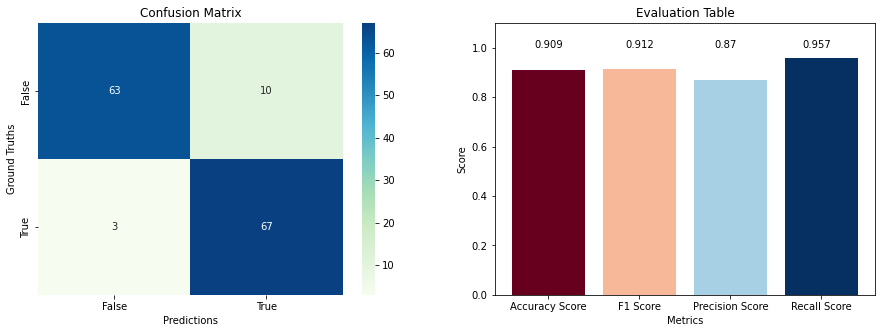

In [39]:
dt_model = DecisionTreeClassifier().fit(x_train, y_train)
y_prediction = dt_model.predict(x_test)

# Accuracy Score
model_accuracy_score = round(accuracy_score(y_test, y_prediction),3)

# F1 Score
model_f1_score = round(f1_score(y_test, y_prediction),3)

# Precision Score
model_precision_score = round(precision_score(y_test, y_prediction),3)

# Recall Score
model_recall_score = round(recall_score(y_test, y_prediction),3)

fig, axes = plt.subplots(1, 2, figsize=(15, 5))

# Confusion Matrix
ax = sns.heatmap(confusion_matrix(y_test, y_prediction), annot=True, cmap="GnBu", ax=axes[0])
ax.set_title("Confusion Matrix")
ax.set_xlabel("Predictions")
ax.set_ylabel("Ground Truths")
ax.xaxis.set_ticklabels(['False','True'])
ax.yaxis.set_ticklabels(['False','True']);

# Score Plot
scores = {"Accuracy Score":model_accuracy_score,"F1 Score": model_f1_score,
                         "Precision Score": model_precision_score,"Recall Score":model_recall_score}
axes[1].bar(scores.keys(), scores.values(), color=color_list)
axes[1].annotate(model_accuracy_score, (-0.15, 1))
axes[1].annotate(model_f1_score, (0.85, 1))
axes[1].annotate(model_precision_score, (1.82, 1))
axes[1].annotate(model_recall_score, (2.79, 1))
axes[1].set_title("Evaluation Table")
axes[1].set_ylim([0, 1.1])
axes[1].set_xlabel("Metrics")
axes[1].set_ylabel("Score");

In [40]:
np_test = np.concatenate([x_test.to_numpy(),y_test.to_numpy().reshape(-1, 1), y_prediction.reshape(-1, 1)], axis=1)
df_test = pd.DataFrame(np_test)
df_test.columns = [*df.drop("diagnosis", axis=1), "diagnosis", "prediction"]
df_test[df_test.prediction != df_test.diagnosis]

,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave_points_mean,symmetry_mean,fractial_dimension_mean,...,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave_points_worst,symmetry_worst,fractial_dimension_worst,diagnosis,prediction
24,0.042470,0.757263,0.076459,-0.069621,0.532900,0.217248,0.730491,0.327700,0.422968,-0.419652,...,-0.084468,-0.264880,0.249317,0.126349,0.731384,0.334104,-0.325060,-0.020791,1.0,0.0
25,0.141893,1.100341,0.109429,0.023947,-0.468979,-0.343648,-0.724617,-0.497012,-0.459966,-0.584691,...,-0.126328,-0.131981,-0.913064,-0.491995,-0.863906,-0.685971,-0.611453,-0.634629,0.0,1.0
27,0.085080,-0.645393,0.092120,-0.037199,0.084691,0.188572,-0.105489,-0.168890,0.371678,0.192128,...,0.127819,-0.029046,-0.127909,0.534316,0.500880,0.413582,0.252608,0.208634,0.0,1.0
36,0.022586,0.285821,0.020410,-0.102043,-0.499619,0.129309,-0.477092,-0.470835,-1.115755,-0.381238,...,0.148749,-0.088269,-0.746383,0.571404,-0.097275,0.298950,-0.591926,-0.294657,0.0,1.0
55,0.238476,-0.047922,0.210812,0.093911,-0.456152,-0.110993,-0.366394,-0.014418,0.250778,-0.604609,...,0.059050,-0.121229,-0.044568,0.316265,-0.437979,0.528214,0.104530,0.046425,0.0,1.0
58,0.193025,-0.384000,0.163418,0.058360,-0.322901,-0.289356,-0.602558,-0.677661,0.302069,-0.556236,...,-0.036629,-0.086506,-0.426180,-0.418459,-0.314787,-0.477799,1.142704,-0.612964,0.0,1.0
67,-0.670534,-0.271974,-0.697100,-0.634730,0.239319,-0.858281,-0.777252,-0.352389,-0.701765,0.014285,...,-0.658541,-0.572805,-0.816565,-1.111363,-1.011592,-0.653263,-1.496667,-0.818502,1.0,0.0
95,-0.829611,2.348962,-0.875550,-0.762995,-1.555654,-1.308681,-1.116163,-1.263409,-2.555102,-1.102570,...,-0.954847,-0.773741,-1.739013,-1.269946,-1.306098,-1.747619,-2.167087,-1.379566,0.0,1.0
96,0.042470,0.757263,0.076459,-0.069621,0.532900,0.217248,0.730491,0.327700,0.422968,-0.419652,...,-0.084468,-0.264880,0.249317,0.126349,0.731384,0.334104,-0.325060,-0.020791,1.0,0.0
118,0.099283,1.326727,0.160533,0.006030,-0.566601,0.362538,0.157435,-0.255197,0.225132,0.091113,...,0.190609,-0.122815,0.073863,1.065696,0.638028,0.094140,0.470657,1.023010,0.0,1.0


### 3.5 KNeighborsClassifier

KNN considers each data point that will be predicted by checking next data points to it. So, it compares by similarities and determines the output.

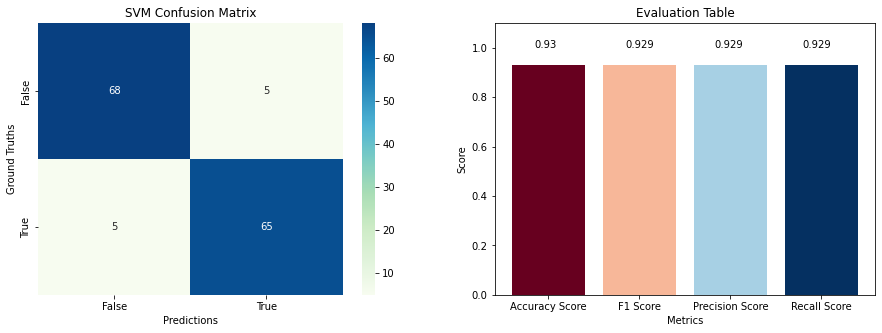

In [41]:
knn_model = KNeighborsClassifier().fit(x_train, y_train)
y_prediction = knn_model.predict(x_test)

# Accuracy Score
model_accuracy_score = round(accuracy_score(y_test, y_prediction),3)

# F1 Score
model_f1_score = round(f1_score(y_test, y_prediction),3)

# Precision Score
model_precision_score = round(precision_score(y_test, y_prediction),3)

# Recall Score
model_recall_score = round(recall_score(y_test, y_prediction),3)

fig, axes = plt.subplots(1, 2, figsize=(15, 5))

# Confusion Matrix
ax = sns.heatmap(confusion_matrix(y_test, y_prediction), annot=True, cmap="GnBu", ax=axes[0])
ax.set_title("SVM Confusion Matrix")
ax.set_xlabel("Predictions")
ax.set_ylabel("Ground Truths")
ax.xaxis.set_ticklabels(['False','True'])
ax.yaxis.set_ticklabels(['False','True']);

# Score Plot
scores = {"Accuracy Score":model_accuracy_score,"F1 Score": model_f1_score,
                         "Precision Score": model_precision_score,"Recall Score":model_recall_score}
axes[1].bar(scores.keys(), scores.values(), color=color_list)
axes[1].annotate(model_accuracy_score, (-0.15, 1))
axes[1].annotate(model_f1_score, (0.85, 1))
axes[1].annotate(model_precision_score, (1.82, 1))
axes[1].annotate(model_recall_score, (2.79, 1))
axes[1].set_title("Evaluation Table")
axes[1].set_ylim([0, 1.1])
axes[1].set_xlabel("Metrics")
axes[1].set_ylabel("Score");

In [42]:
np_test = np.concatenate([x_test.to_numpy(),y_test.to_numpy().reshape(-1, 1), y_prediction.reshape(-1, 1)], axis=1)
df_test = pd.DataFrame(np_test)
df_test.columns = [*df.drop("diagnosis", axis=1), "diagnosis", "prediction"]
df_test[df_test.prediction != df_test.diagnosis]

,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave_points_mean,symmetry_mean,fractial_dimension_mean,...,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave_points_worst,symmetry_worst,fractial_dimension_worst,diagnosis,prediction
20,0.147575,-0.948796,0.158884,-0.006768,1.202719,0.570915,0.141783,0.567442,1.119057,0.098227,...,0.068020,-0.132157,-0.202477,0.353992,-0.053003,0.387599,0.412077,0.046981,0.0,1.0
27,0.085080,-0.645393,0.092120,-0.037199,0.084691,0.188572,-0.105489,-0.168890,0.371678,0.192128,...,0.127819,-0.029046,-0.127909,0.534316,0.500880,0.413582,0.252608,0.208634,0.0,1.0
53,0.354943,0.806274,0.341456,0.210231,-0.307937,-0.008334,0.300068,0.676039,-0.342730,-0.256036,...,0.011211,-0.084038,-0.290204,-0.344283,0.063452,0.508345,-0.556127,-0.866831,1.0,0.0
67,-0.670534,-0.271974,-0.697100,-0.634730,0.239319,-0.858281,-0.777252,-0.352389,-0.701765,0.014285,...,-0.658541,-0.572805,-0.816565,-1.111363,-1.011592,-0.653263,-1.496667,-0.818502,1.0,0.0
87,-0.704622,-0.227630,-0.690094,-0.687629,1.273976,-0.044657,-0.223761,-0.360165,-0.034985,0.345785,...,-0.646283,-0.629032,1.600310,0.079669,0.076445,0.114010,-0.149319,0.393618,0.0,1.0
113,-0.383628,0.738592,-0.420152,-0.420859,-0.411260,-0.887531,-0.521523,-0.562585,-0.826328,-0.301564,...,-0.451038,-0.396546,0.420384,-0.647381,-0.258484,-0.321440,-0.111892,-0.178556,1.0,0.0
118,0.099283,1.326727,0.160533,0.006030,-0.566601,0.362538,0.157435,-0.255197,0.225132,0.091113,...,0.190609,-0.122815,0.073863,1.065696,0.638028,0.094140,0.470657,1.023010,0.0,1.0
121,0.286767,2.451652,0.197624,0.185488,-0.935002,-1.108525,-0.524678,-0.553513,0.151860,-1.398501,...,0.088950,0.093102,-0.768315,-0.990380,-0.561652,-0.742676,0.545510,-1.235134,1.0,0.0
125,-0.193304,0.530877,-0.236344,-0.259602,-1.047589,-0.835914,-0.723607,-0.737013,-0.097267,-0.981636,...,-0.138287,-0.159830,-1.005178,-0.314869,-0.302756,-0.048004,0.156601,-0.690180,1.0,0.0
138,-0.221711,-0.804096,-0.223568,-0.381896,0.817929,0.945610,0.359393,0.547485,0.481586,0.889273,...,-0.312901,-0.464758,0.933586,1.442329,1.031665,0.862941,1.023916,0.984124,0.0,1.0


### 3.6 Visualizing Wrong Predicted Data


Instead of visualizing  wrong predictions of all models with plots, I will be showing only **logistic regression** failure predictions. It can be also switched to other machine learning algorithms just by changing the machine learning model that predicts y_prediction. At first I was about to plot pairplots, but because of there is 30 features it would take lot of space or too small for us to see. So, what I have done to visualize is obtaining wrong predictions, then subtracting their each mean of future to ground truth feature means.

In [43]:
# Prediction and generating a Data Frame for it
y_prediction = lg_model.predict(x_test)
np_test = np.concatenate([x_test.to_numpy(),y_test.to_numpy().reshape(-1, 1), y_prediction.reshape(-1, 1)], axis=1)
df_test = pd.DataFrame(np_test)
df_test.columns = [*df.drop("diagnosis", axis=1), "diagnosis", "prediction"]
df_test[df_test.prediction != df_test.diagnosis]

# Getting indexes
wrong_pred_idx = df_test[df_test.diagnosis != df_test.prediction].index

# Fancy indexing
df_false_positive = df_test.loc[wrong_pred_idx][df_test.prediction == 1]
df_false_negative = df_test.loc[wrong_pred_idx][df_test.prediction == 0]

# Generating dictionary for false negatives 
# Appending eac
false_negative_d = dict()
for col in df_over.drop("diagnosis", axis=1).columns:
    false_negative_d[col] = round(abs(df_over.loc[df_over.diagnosis ==0,col].mean())- abs(df_false_negative[col].mean()),3)

# Generating dictionary for false positives
false_positive_d= dict()
for col in df_over.drop("diagnosis", axis=1).columns:
    false_positive_d[col] = round(abs(df_over.loc[df_over.diagnosis ==1,col].mean()) - abs(df_false_positive[col].mean()),3)

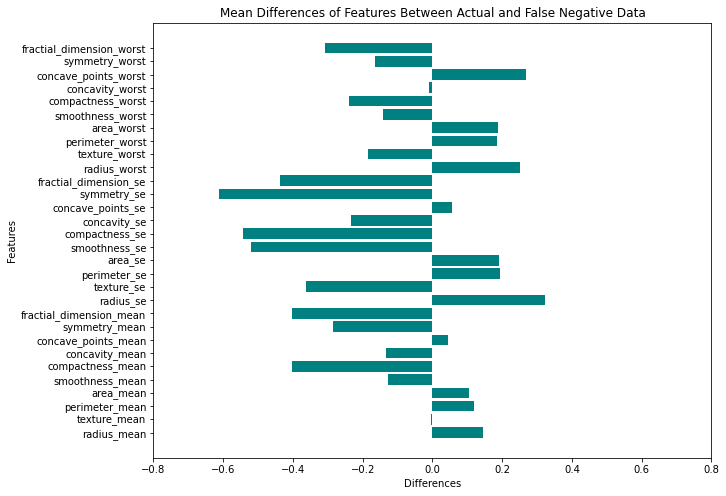

In [44]:
plt.figure(figsize=(10, 8))
plt.barh(list(false_negative_d.keys()), false_negative_d.values(), color="teal");
plt.xlim([-0.8, 0.8])
plt.title("Mean Differences of Features Between Actual and False Negative Data")
plt.xlabel("Differences")
plt.ylabel("Features");

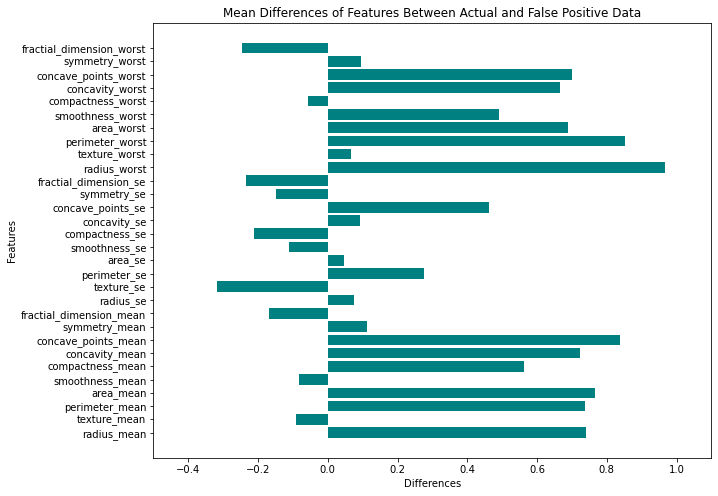

In [45]:
plt.figure(figsize=(10,8))
plt.barh(list(false_positive_d.keys()), false_positive_d.values(), color="teal");
plt.xlim([-0.5, 1.1])
plt.title("Mean Differences of Features Between Actual and False Positive Data")
plt.xlabel("Differences")
plt.ylabel("Features");

By analysing these 2 plots, means of these values highly differ from actual features which helps us to understand why machine learning model predicted wrong these data points.

### 3.7 Feature Importance of Logistic Regression

With same reason of visualing wrong predictions of logistic regression, only feature importances of logistic regression is shown. Ranking of features are similiar to ranking of correlations shown at visualization section. I obtained coefficients from trained logistic regression and matched with feature names then sorted regarding to absolute value of each coefficient. 

In [46]:
feature_importances = abs(lg_model.coef_[0])
importance_list = list()
for i,col in enumerate(df.drop("diagnosis", axis=1).columns):
    importance_list.append([col, round(feature_importances[i], 3)])

importance_list = np.array(sorted(importance_list, key=lambda x: x[1]))

N = len(importance_list)
color_map = cm.get_cmap('GnBu', N)
color_list = [color_map(i) for i in range(N)]

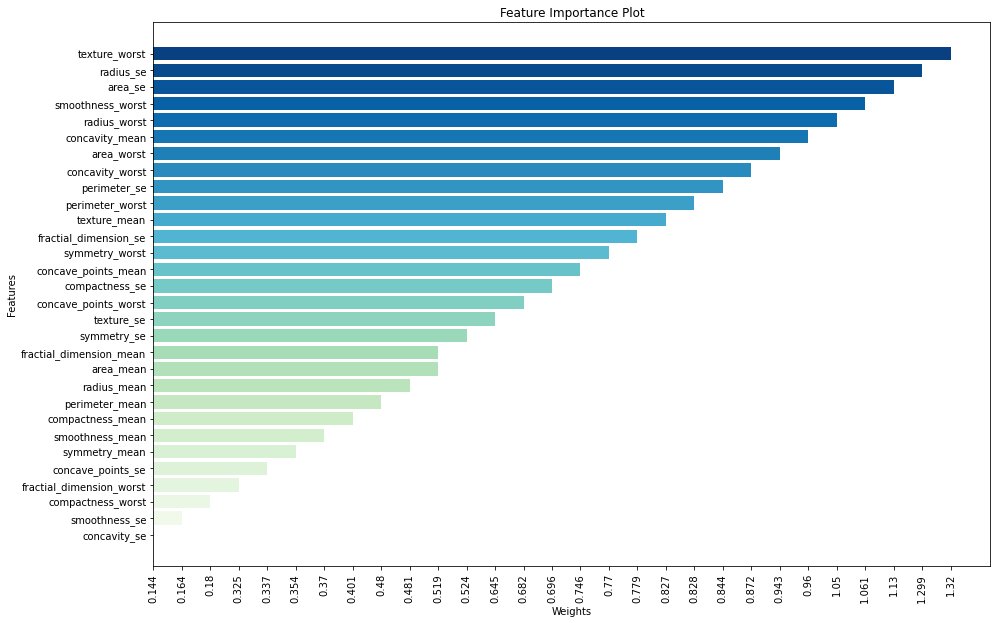

In [47]:
plt.figure(figsize=(15,10))
plt.barh(importance_list[:, 0], importance_list[:, 1], color=color_list)
plt.xticks(rotation=90)
plt.title("Feature Importance Plot")
plt.ylabel("Features")
plt.xlabel("Weights");

### 3.8 Conclusion

Since, malignant and benign data characteristics distinguish from each other ,as I explained data visualization section, all models performed well. Their result scores are very alike. However, by comparing all trained machine learning models it can be seen **logistic regression** performed best. There may be few reasons of why other models not performed better than logistic regression.

1. Logistic regression performs well on linearly seperable data sets. 
2. Total number of over-sampled data is 714,it is actually low when compared to real life data.
3. Training machine learning models with default parameters instead of parameter tuning. 

With the aim of reaching better results at prediction voting classifiers, gradient boost based algorithms, parameter tuning, collecting new features or data can be tried.